In [1]:
# %matplotlib widget
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster, GroupedLayerControl
import ast
import seaborn as sns
from scipy.optimize import curve_fit

from data_utilities import *

In [2]:
visible_minorities_names = ["Filipino", "South Asian", "Black", "Chinese", "Southeast Asian", "Latin American", "Arab", "Korean", "West Asian", "Japanese", "Multiple", "Others"]
census_df = pd.read_csv("./assets/census_2016_new.csv")
census_df = census_df[census_df["Boundary Type"] == "Neighbourhood"]
census_df["Visible Minorities Numbers"] = census_df["Visible Minorities Numbers"].str.strip("[]").str.split(", ")
census_df["Visible Minorities Percent"] = census_df["Visible Minorities Percent"].str.strip("[]").str.split(", ")

for index, row in census_df.iterrows():
    if row["Population 2016"] == 0:
        census_df.loc[index, "Aboriginal Percent"] = 0.0
    else: 
        census_df.loc[index, "Aboriginal Percent"] = float(row["Aboriginal"])/row["Population 2016"] # type: ignore
    for inames in range(len(visible_minorities_names)):
        try:
            census_df.loc[index, visible_minorities_names[inames]] = int(row["Visible Minorities Numbers"][inames]) # type: ignore
            census_df.loc[index, visible_minorities_names[inames]+" Percent"] = float(row["Visible Minorities Numbers"][inames])/row["Population 2016"]  #float(row["Visible Minorities Percent"][inames]) # type: ignore
        except (IndexError, ZeroDivisionError):
            census_df.loc[index, visible_minorities_names[inames]] = 0 # type: ignore
            census_df.loc[index, visible_minorities_names[inames]+" Percent"] = 0.0 # type: ignore

def plot_events(services_filter: list = [], bins=6):
    """
    Plot events on a map

    Args:
    service_filter: a list that either contains the index of the service or the name of the service. Empty list means all services.
    """
    WINNIPEG = [49.88366050119829, -97.14581222292078]
    m = folium.Map(location=WINNIPEG, zoom_start=12, nan_fill_color="white")

    data = pd.DataFrame()
    if len(services_filter) != 0:
        for i in range(len(services_filter)):
            if type(services_filter[i]) != str:
                services_filter[i] = services[services_filter[i]]
        for i in services_filter:
            # data = DF[DF["Service Area and Request"].isin(services_filter)]
            data = DF[DF["Service Request"].isin(services_filter)]
    else:
        services_filter = services
        data = DF

    choropleths = []

    # By neighbourhood
    hood_data = data.groupby("Neighbourhood").size()
    # choropleths.append(folium.Choropleth(
    #     geo_data="assets/Neighbourhood.geojson",
    #     data=hood_data,
    #     key_on="feature.properties.name",
    #     name="Requests",
    #     nan_fill_color="white",
    #     bins=bins # type: ignore
    # ).add_to(m))

    # choropleths.append(folium.Choropleth(
    #     geo_data="assets/Neighbourhood.geojson",
    #     data=census_df,
    #     columns=["Boundary Name", "Population Density 2016"],
    #     key_on="feature.properties.name",
    #     name="population density",
    #     no_data_fill_color="#FFFFFF",
    # ).add_to(m))

    # choropleths.append(folium.Choropleth(
    #     geo_data="assets/Neighbourhood.geojson",
    #     data=census_df,
    #     columns=["Boundary Name", "Year opened"],
    #     key_on="feature.properties.name",
    #     name="Year opened"
    # ).add_to(m))

    # choropleths.append(folium.Choropleth(
    #     geo_data="assets/Neighbourhood.geojson",
    #     data=census_df,
    #     columns=["Boundary Name", "Unemployment Rate"],
    #     key_on="feature.properties.name",
    #     name="Unemployment Rate"
    # ).add_to(m))

    # choropleths.append(folium.Choropleth(
    #     geo_data="assets/Neighbourhood.geojson",
    #     data=census_df,
    #     columns=["Boundary Name", "Bad Dwelling"],
    #     key_on="feature.properties.name",
    #     name="Bad Dwelling"
    # ).add_to(m))

    ethic_choropleths = []

    for ethic in visible_minorities_names:
        ethic += " Percent"
        ethic_choropleths.append(folium.Choropleth(
            geo_data="assets/Neighbourhood.geojson",
            data=census_df,
            columns=["Boundary Name", ethic],
            key_on="feature.properties.name",
            name=ethic
        ).add_to(m))

    ethic_choropleths.append(folium.Choropleth(
        geo_data="assets/Neighbourhood.geojson",
        data=census_df,
        columns=["Boundary Name", "Aboriginal Percent"],
        key_on="feature.properties.name",
        name="Aboriginal Percent"
    ).add_to(m))

    for j in choropleths+ethic_choropleths:
        for i in j.geojson.data['features']:
            if i['properties']['name'] == "Prairie Pointe": # edge case: we don't have data for this neighbourhood, it doesn't exist in the 311 dataset
                continue
            
            try:
                i['properties']['events'] = str(hood_data[i['properties']['name']])
            except KeyError:
                i['properties']['events'] = "0"

            try:
                i['properties']['density'] = str(float(census_df[census_df["Boundary Name"] == i['properties']['name']]["Population Density 2016"])) # type: ignore
            except KeyError:
                i['properties']['density'] = "KeyError"
            except TypeError:
                i['properties']['density'] = "TypeError"

            try:
                i['properties']['Population'] = str(float(census_df[census_df["Boundary Name"] == i['properties']['name']]["Population 2016"])) # type: ignore
            except KeyError:
                i['properties']['Population'] = "KeyError"
            except TypeError:
                i['properties']['Population'] = "TypeError"

            try:
                i['properties']['year'] = str(float(census_df[census_df["Boundary Name"] == i['properties']['name']]["Year opened"])) # type: ignore
            except KeyError:
                i['properties']['year'] = "KeyError"
            except TypeError:
                i['properties']['year'] = "TypeError"
            except IndexError:
                i['properties']['year'] = "IndexError"

            try:
                i['properties']['Ward'] = DF[DF['Neighbourhood'] == i['properties']['name']].head(1)["Ward"].values[0]
            except KeyError:
                i['properties']['Ward'] = "KeyError"
            except TypeError:
                i['properties']['Ward'] = "TypeError"
            except IndexError:
                i['properties']['Ward'] = "IndexError"

            try:
                i['properties']['Aboriginal'] = str(census_df[census_df["Boundary Name"] == i['properties']['name']]["Aboriginal"].values[0]) + ", " + "{:.2%}".format(census_df[census_df["Boundary Name"] == i['properties']['name']]["Aboriginal Percent"].values[0])
            except KeyError:
                i['properties']['Aboriginal'] = "KeyError"
            except TypeError:
                i['properties']['Aboriginal'] = "TypeError"
            except IndexError:
                i['properties']['Aboriginal'] = "IndexError"

            try:
                i['properties']['Total Visible Minorities'] = str(census_df[census_df["Boundary Name"] == i['properties']['name']]["Visible Minorities Total Number"].values[0]) + ", " + "{:.2%}".format(census_df[census_df["Boundary Name"] == i['properties']['name']]["Visible Minorities Total Percent"].values[0])
            except KeyError:
                i['properties']['Total Visible Minorities'] = "KeyError"
            except TypeError:
                i['properties']['Total Visible Minorities'] = "TypeError"
            except IndexError:
                i['properties']['Total Visible Minorities'] = "IndexError"

            try:
                visible_minorities = ["", "", "", ""]
                for j in range(len(visible_minorities_names)):
                    visible_minorities[j//3] += visible_minorities_names[j]
                    visible_minorities[j//3] += ": "
                    visible_minorities[j//3] += str(int(census_df[census_df["Boundary Name"] == i['properties']['name']][visible_minorities_names[j]]))
                    visible_minorities[j//3] += ", "
                    visible_minorities[j//3] += "{:.2%}".format(float(census_df[census_df["Boundary Name"] == i['properties']['name']][visible_minorities_names[j]+" Percent"]))
                    visible_minorities[j//3] += "; "
                i['properties']['Visible Minorities 0'] = visible_minorities[0][:-2]
                i['properties']['Visible Minorities 1'] = visible_minorities[1][:-2]
                i['properties']['Visible Minorities 2'] = visible_minorities[2][:-2]
                i['properties']['Visible Minorities 3'] = visible_minorities[3][:-2]
            except KeyError:
                i['properties']['Visible Minorities 0'] = "KeyError"
                i['properties']['Visible Minorities 1'] = "KeyError"
                i['properties']['Visible Minorities 2'] = "KeyError"
                i['properties']['Visible Minorities 3'] = "KeyError"
            except ValueError:
                i['properties']['Visible Minorities 0'] = "ValueError"
                i['properties']['Visible Minorities 1'] = "ValueError"
                i['properties']['Visible Minorities 2'] = "ValueError"
                i['properties']['Visible Minorities 3'] = "ValueError"
            except IndexError:
                i['properties']['Visible Minorities 0'] = "IndexError"
                i['properties']['Visible Minorities 1'] = "IndexError"
                i['properties']['Visible Minorities 2'] = "IndexError"
                i['properties']['Visible Minorities 3'] = "IndexError"

            try:
                citizenship = ""
                citizenship += "Canadian: "
                citizenship += str(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Citizenship Numbers"].values[0])[0])
                citizenship += ", "
                citizenship += "{:.2%}".format(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Citizenship Percent"].values[0])[0])
                citizenship += "; "
                citizenship += "Non-Canadian: "
                citizenship += str(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Citizenship Numbers"].values[0])[1])
                citizenship += ", "
                citizenship += "{:.2%}".format(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Citizenship Percent"].values[0])[1])
                i['properties']['Citizenship'] = citizenship
            except KeyError:
                i['properties']['Citizenship'] = "KeyError"
            except ValueError:
                i['properties']['Citizenship'] = "ValueError"
            except IndexError:
                i['properties']['Citizenship'] = "IndexError"

            try:
                education = ""
                education += "None: "
                education += str(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Education Numbers"].values[0])[0])
                education += ", "
                education += "{:.2%}".format(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Education Percent"].values[0])[0])
                education += "; "
                education += "High school: "
                education += str(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Education Numbers"].values[0])[1])
                education += ", "
                education += "{:.2%}".format(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Education Percent"].values[0])[1])
                education += "; "
                education += "Post-secondary: "
                education += str(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Education Numbers"].values[0])[2])
                education += ", "
                education += "{:.2%}".format(ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Education Percent"].values[0])[2])
                i['properties']['Education'] = education
            except KeyError:
                i['properties']['Education'] = "KeyError"
            except ValueError:
                i['properties']['Education'] = "ValueError"
            except IndexError:
                i['properties']['Education'] = "IndexError"

            try:
                i['properties']['Unemployment Rate'] = "{:.2%}".format(census_df[census_df["Boundary Name"] == i['properties']['name']]["Unemployment Rate"].values[0])
            except KeyError:
                i['properties']['Unemployment Rate'] = "KeyError"
            except ValueError:
                i['properties']['Unemployment Rate'] = "ValueError"
            except IndexError:
                i['properties']['Unemployment Rate'] = "IndexError"

            try:
                period_of_construction = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Period of Construction"].values[0])
                period_of_construction_percent = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Period of Construction Percent"].values[0])
                period_of_construction_name = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Period of Construction Name"].values[0])
                i['properties']['Period of Construction'] = ""
                for j in [0,1,2]:
                    i['properties']['Period of Construction'] += period_of_construction_name[j]
                    i['properties']['Period of Construction'] += ": "
                    i['properties']['Period of Construction'] += str(period_of_construction[j])
                    i['properties']['Period of Construction'] += ", "
                    i['properties']['Period of Construction'] += "{:.2%}".format(period_of_construction_percent[j])
                    i['properties']['Period of Construction'] += "; "
                i['properties']['Period of Construction'] = i['properties']['Period of Construction'][:-2]
            except KeyError:
                i['properties']['Period of Construction'] = "KeyError"
            except ValueError:
                i['properties']['Period of Construction'] = "ValueError"
            except IndexError:
                i['properties']['Period of Construction'] = "IndexError"

            try:
                household_type = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Household Type"].values[0])
                i['properties']['Household Type']  = "Houses: "
                i['properties']['Household Type'] += str(household_type[0])
                i['properties']['Household Type'] += "; "
                i['properties']['Household Type'] += "Apartments: "
                i['properties']['Household Type'] += str(household_type[1])
                i['properties']['Household Type'] += "; "
                i['properties']['Household Type'] += "Others: "
                i['properties']['Household Type'] += str(household_type[2])
            except KeyError:
                i['properties']['Household Type'] = "KeyError"
            except ValueError:
                i['properties']['Household Type'] = "ValueError"
            except IndexError:
                i['properties']['Household Type'] = "IndexError"

            try:
                commuting_method = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Own vs Rent"].values[0])
                commuting_method_precent = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Own vs Rent Percent"].values[0])
                i['properties']['Dwelling Tenure']  = "Own: "
                i['properties']['Dwelling Tenure'] += str(commuting_method[0]) + ", " + "{:.2%}".format(commuting_method_precent[0])
                i['properties']['Dwelling Tenure'] += "; "
                i['properties']['Dwelling Tenure'] += "Rent: "
                i['properties']['Dwelling Tenure'] += str(commuting_method[1]) + ", " + "{:.2%}".format(commuting_method_precent[1])
            except KeyError:
                i['properties']['Dwelling Tenure'] = "KeyError"
            except ValueError:
                i['properties']['Dwelling Tenure'] = "ValueError"
            except IndexError:
                i['properties']['Dwelling Tenure'] = "IndexError"

            try:
                bad_dwelling = str(census_df[census_df["Boundary Name"] == i['properties']['name']]["Bad Dwelling"].values[0])
                bad_dwelling_precent = float(census_df[census_df["Boundary Name"] == i['properties']['name']]["Bad Dwelling Percent"].values[0])
                i['properties']['Bad Dwelling']  = "Bad Dwelling: "
                i['properties']['Bad Dwelling'] += str(bad_dwelling) + ", " + "{:.2%}".format(bad_dwelling_precent)
            except KeyError:
                i['properties']['Bad Dwelling'] = "KeyError"
            except ValueError:
                i['properties']['Bad Dwelling'] = "ValueError"
            except IndexError:
                i['properties']['Bad Dwelling'] = "IndexError"

            try:
                avg_med_household_income = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Average and Median Household Income"].values[0])
                i['properties']['Average Household Income'] = avg_med_household_income[0]
                i['properties']['Median Household Income'] = avg_med_household_income[1]
            except KeyError:
                i['properties']['Average Household Income'] = "KeyError"
                i['properties']['Median Household Income'] = "KeyError"
            except ValueError:
                i['properties']['Average Household Income'] = "ValueError"
                i['properties']['Median Household Income'] = "ValueError"
            except IndexError:
                i['properties']['Average Household Income'] = "IndexError"
                i['properties']['Median Household Income'] = "IndexError"

            try:
                commuting_method = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Commuting Method"].values[0])
                commuting_method_precent = ast.literal_eval(census_df[census_df["Boundary Name"] == i['properties']['name']]["Commuting Method Percent"].values[0])
                i['properties']['Commuting Method']  = "Private: "
                i['properties']['Commuting Method'] += str(commuting_method[0]) + ", " + "{:.2%}".format(commuting_method_precent[0])
                i['properties']['Commuting Method'] += "; "
                i['properties']['Commuting Method'] += "Public: "
                i['properties']['Commuting Method'] += str(commuting_method[1]) + ", " + "{:.2%}".format(commuting_method_precent[1])
            except KeyError:
                i['properties']['Commuting Method'] = "KeyError"
            except ValueError:
                i['properties']['Commuting Method'] = "ValueError"
            except IndexError:
                i['properties']['Commuting Method'] = "IndexError"

    tooltip = [
        'name',
        'Ward',
        'events',
        'Population',
        'density',
        'year',
        'Aboriginal',
        'Total Visible Minorities',
        'Visible Minorities 0',
        'Visible Minorities 1',
        'Visible Minorities 2',
        'Visible Minorities 3',
        'Citizenship',
        'Education',
        'Unemployment Rate',
        'Period of Construction',
        'Household Type',
        'Dwelling Tenure',
        'Bad Dwelling',
        'Average Household Income',
        'Median Household Income',
        'Commuting Method'
        ]
    
    # for c in choropleths:
    #     folium.GeoJsonTooltip(tooltip).add_to(c.geojson)
    for c in ethic_choropleths:
        folium.GeoJsonTooltip(tooltip).add_to(c.geojson)

    layer_control = folium.LayerControl().add_to(m)
    # GroupedLayerControl( # example: https://github.com/chansooligans/folium/blob/81a04d3628b78b9538daadc3da81c9b1ee278692/examples/plugin-GroupedLayerControl.ipynb
    #     groups={"Division": choropleths}, nan_fill_color="white", collapsed=False # either ward or neighbourhood, radio button choose one
    # ).add_to(m)

    GroupedLayerControl( # example: https://github.com/chansooligans/folium/blob/81a04d3628b78b9538daadc3da81c9b1ee278692/examples/plugin-GroupedLayerControl.ipynb
        groups={"Ethics": ethic_choropleths}, nan_fill_color="white", collapsed=False # either ward or neighbourhood, radio button choose one
    ).add_to(m)

    return m


In [3]:
plot_events()

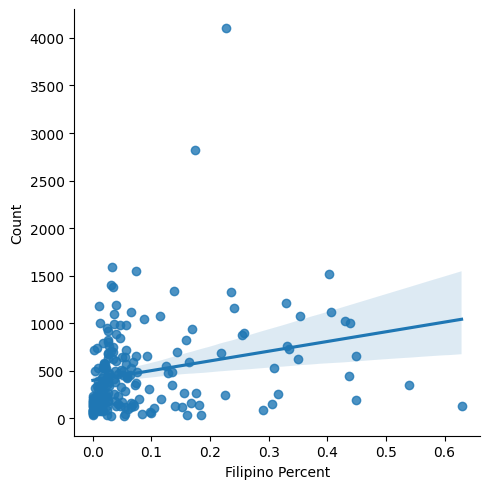

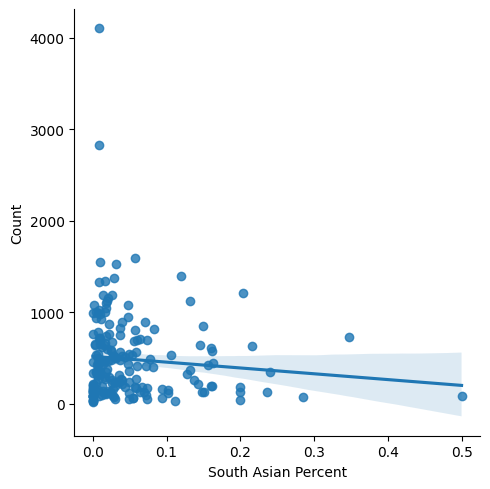

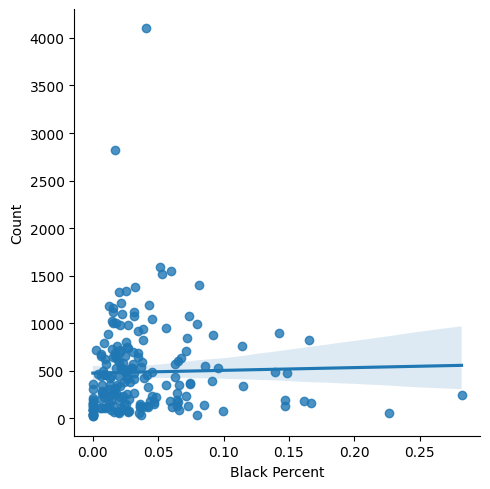

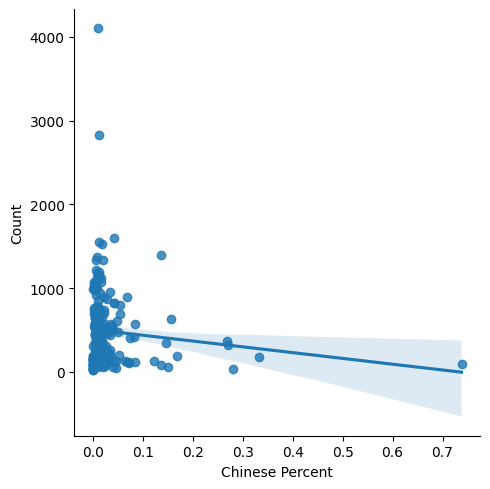

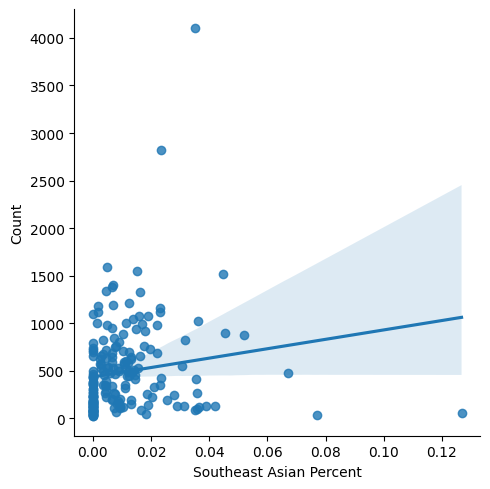

...

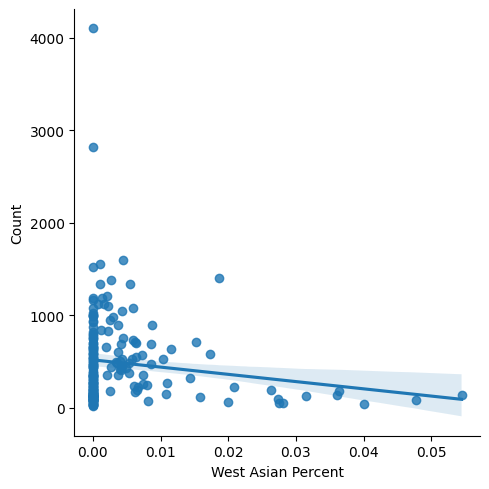

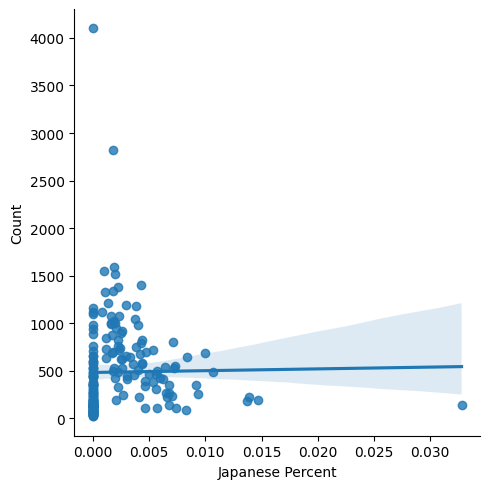

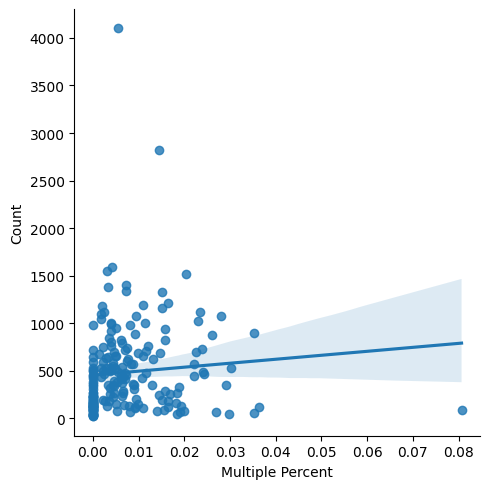

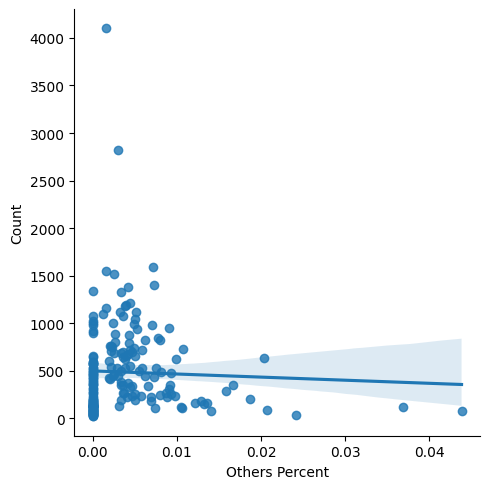

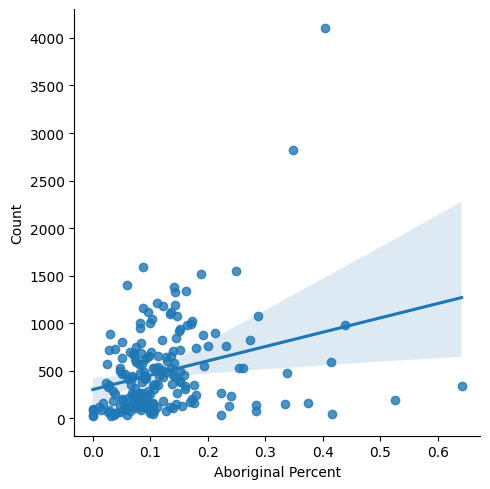

In [4]:
services_filter: list = []

data = pd.DataFrame()
if len(services_filter) != 0:
    for i in range(len(services_filter)):
        if type(services_filter[i]) != str:
            services_filter[i] = services[services_filter[i]]
    for i in services_filter:
        # data = DF[DF["Service Area and Request"].isin(services_filter)]
        data = DF[DF["Service Request"].isin(services_filter)]
else:
    data = DF

combined_df = data.groupby("Neighbourhood").size().sort_values().to_frame().rename(columns={0: "Count"})
combined_df = pd.merge(combined_df, census_df, left_on="Neighbourhood", right_on="Boundary Name", how="inner")
combined_df = combined_df[combined_df['Population 2016'] != 0]

for ethic in visible_minorities_names:
    sns.lmplot(x=ethic+" Percent", y="Count", data=combined_df)
    plt.show()

sns.lmplot(x="Aboriginal Percent", y="Count", data=combined_df)
plt.show()